# MIDESP for Commercial phenotype

## Generating input files

For running MIDESP we need to prepare two [PLINK-compatible files](https://www.cog-genomics.org/plink/1.9/formats):

1) `.tped` file with genotype information:

Variant information + genotype call text file. Contains no header line, and one line per variant with $2N + 4$ fields where $N$ is the number of samples. The first four columns contains chromosome, SNP ID, and its position on chromosome for each variant. The fifth and sixth fields are allele calls for the first sample in the `.tfam` file ('0' = no call); the 7th and 8th are allele calls for the second sample; and so on. One line per variant contains the following fields:

- **chromosome** (chr);
- **locus name** (SNP ID);
- **genetic distance** (dist) (0);
- **physical position** (pos)
- **genotype** (5th, 6th fields, *etc.*)

| **chr** | **SNP ID** | **dist** | **pos** | **genotype**   | ... |   |   |   |   | | 
|:------:|:-------------:|:-:|:------:|:-:|:-:|:-:|:-:|:-:|:-:|:---:|
| 1 | chr1:123445 | 0 | 123445 | A | A | A | A | G | G | ... |
| 1 | chr1:153686 | 0 | 153686 | G | G | G | G | T | T | ... |
| 1 | chr1:164083 | 0 | 164083 | T | T | T | T | C | C | ... |
| ...    | ...           | ... | ... | ... | ... | ... | ... | ...| ... | ... |

2) `.tfam` file with phenotype:

A text file with no header line, and one line per sample with the following fields:

- **Family ID** (FID);
- **Within-family ID** (IID) - could be the same as FID;
- **Phenotype value** (pheno) - in our case, continuous phenotype

| **FID**     | **IID**     | **pheno** |
|:-----------:|:-----------:|:---------:|
| b2_l001_s1.bam       | b2_l001_s1.bam       | 1635.03      |      
| b1_l003_s1.bam    | b1_l003_s1.bam    | 1561.38      |
| b1_l004_s1.bam | b1_l004_s1.bam | 1576.11      |
| ...         | ...         | ...       |

Authors recommended to use `PLINK` software. Among amino acid contents, we have chosen to analyse **Ala phenotype**.

**NOTE**: For more information about `MIDESP`, see [README.md](../README.md), [the authors article](https://www.mdpi.com/2079-7737/10/9/921) and their [Github repository](https://github.com/FelixHeinrich/MIDESP).

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

from parsing_midesp import (parse_features, generate_1kb_regions, parse_gene_info,
                            generate_bed_file_unique, assign_gene_for_snp, 
                            parse_kegg_results, plot_graph,
                            filter_graph_by_degree, filter_graph_by_MIAPC)

import warnings
warnings.filterwarnings('ignore')

### Filtration using PLINK software

#### Preparing input file with Commercial phenotype

To generate input file with *phenotype* data for `PLINK` filtration, we only duplicated column "IID" to create "FID" column.

In [2]:
# reading file with commercail trait
pheno = pd.read_csv("../../data/commercial_phenotypes.tsv", sep="\t")

# duplicating "IID" column to create "FID"
pheno.insert(0, "FID", pheno["IID"])
pheno.head()

,FID,IID,pheno
0,b2_l001_s1.bam,b2_l001_s1.bam,1635.03
1,b1_l003_s1.bam,b1_l003_s1.bam,1561.38
2,b1_l004_s1.bam,b1_l004_s1.bam,1576.11
3,b1_l005_s1.bam,b1_l005_s1.bam,1325.70
4,b1_l007_s1.bam,b1_l007_s1.bam,1325.70


In [3]:
# writing to file PLINK input with Commercial phenotype
pheno.to_csv("../commercial_dataset/comm_midesp_input/secret_pheno.tsv", columns=["FID", "IID", "pheno"], 
             sep="\t", header=False, index=False)

#### Preparing input file with genotype

Since the `PLINK` software is able to work with `.vcf` files as input, we dropped *indels* and performed genotype imputation using `VCFtools`v0.1.16 and `BEAGLE` v5.4 softwares. The mentioned procedures described in [this notebook](../../AntEpiSeeker/source/AntEpiSeeker_secret.ipynb).

Before running filtration via `PLINK`, we generated **SNP IDs** in *chrN:position* format and added them to `.vcf` file into **ID** column.

In [4]:
# reading .vcf genotype file of commercial dataset
secret_vcf = pd.read_csv("../../data/commercial_genotypes_snps_filled.vcf.gz", sep="\t", skiprows=8, low_memory=False)

# adding "chr" prefix to chromosome names or keeping scaffold names unchanged
secret_vcf["ID"] = secret_vcf["#CHROM"].apply(lambda x: 'chr'+x if x in [str(i) for i in range(21)][1:] else x)

# to combine str in chr and pos columns to create ID column
secret_vcf["ID"] = secret_vcf[["ID", "POS"]].astype(str).agg(':'.join, axis=1)
secret_vcf.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,b2_l001_s1.bam,...,b3_l147_s1.bam,b4_l148_s2.bam,b4_l151_s1.bam,b3_l152_s1.bam,b4_l153_s1.bam,b4_l154_s2.bam,b3_l155_s1.bam,b4_l156_s1.bam,b4_l157_s2.bam,b4_l159_s1.bam
0,1,40522,chr1:40522,C,T,.,PASS,.,GT,0|0,...,0|1,1|0,0|0,0|1,1|0,0|0,0|0,0|1,1|0,1|1
1,1,41592,chr1:41592,T,A,.,PASS,.,GT,0|0,...,0|1,1|0,0|0,0|1,1|0,0|0,1|0,0|1,1|0,0|1
2,1,111641,chr1:111641,G,C,.,PASS,.,GT,1|0,...,0|0,1|0,0|0,1|1,1|1,1|0,1|1,1|1,1|1,1|1
3,1,111675,chr1:111675,G,C,.,PASS,.,GT,1|0,...,0|0,1|0,0|0,1|1,1|1,1|0,1|1,1|1,1|1,1|1
4,1,111688,chr1:111688,T,C,.,PASS,.,GT,1|0,...,0|0,1|0,0|0,1|1,1|1,1|0,1|1,1|1,1|1,1|1


In [5]:
# writing .vcf file with SNP IDs in "ID" column
secret_vcf.to_csv("../commercial_dataset/comm_midesp_input/comm_genotypes_snps_filled_IDs.vcf", sep="\t", index=False)

#### Running initial filtration via PLINK software

As recommended by authors, to ensure the data quality, we applied several filters to the dataset:

1) we removed SNPs with *a minor allele frequency* ≤0.05 (--maf 0.05);
2) a sample was removed if a phenotype was unavailable for it or if *more than 5% of SNPs were missing* (--prune);
3) we removed all redundant SNPs with *a linkage disequilibrium* (LD) ≥0.99, and thus carrying very similar information about the phenotype (--indep-pairwise 10000 5 0.99)

using the following commands:

```
./plink --vcf ../commercial_dataset/comm_midesp_input/comm_genotypes_snps_filled_IDs.vcf 
        --pheno ../commercial_dataset/comm_midesp_input/secret_pheno.tsv 
        --allow-no-sex 
        --allow-extra-chr 
        --double-id 
        --maf 0.05 
        --prune 
        --recode transpose 
        --chr-set 20 
        --out ../commercial_dataset/comm_midesp_input/secret_genotype_filtered

28847 and 97 samples

./plink --allow-no-sex 
        --indep-pairwise 10000 5 0.99 
        --make-founders 
        --allow-extra-chr 
        --double-id 
        --chr-set 20 
        --out ../commercial_dataset/comm_midesp_input/secret_Filtered_PruneInfo 
        --tfile ../commercial_dataset/comm_midesp_input/secret_genotype_filtered

4967 of 28847 variants removed

./plink --allow-no-sex 
        --allow-extra-chr 
        --double-id 
        --extract ../commercial_dataset/comm_midesp_input/secret_Filtered_PruneInfo.prune.in 
        --make-founders 
        --recode transpose 
        --chr-set 20 
        --out ../commercial_dataset/comm_midesp_input/secret_Filtered_Pruned 
        --tfile ../commercial_dataset/comm_midesp_input/secret_genotype_filtered

23880 variants and 97 samples pass filters and QC
```

During the filtration, a lot of auxiliary files were generated. We kept only the necessary files for further analysis.

### Running MIDESP

We have run `MIDESP` v1.2 with parameters **recommended by authors** for *continuous* phenotype using the following command:

```
java -jar MIDESP_1.2.jar -threads 8 
                         -out ../commercial_dataset/comm_midesp_input/secret_Filtered_Pruned.epi 
                         -keep 0.25 -fdr 0.005 -apc 5000 -cont -k 30 
                         ../commercial_dataset/comm_midesp_input/secret_Filtered_Pruned.tped
                         ../commercial_dataset/comm_midesp_input/secret_Filtered_Pruned.tfam

Saving top 18328 pairs (0.25% from 7331334 calculated pairs)
```

**NOTE**: For description of parameters see [README.md](../README.md) section **MIDESP parameters**.

The **MIDESP program** created three files:

1) `.sigSNPs` which contains a list of the SNPs that were found as being strongly associated to the phenotype along with their entropy and the mutual information between the SNP and the phenotype;
2) `.epi` which contains a list of the top SNP pairs that show the strongest association to the phenotype along with the mutual information between the SNP pair and the phenotype and the mutual information corrected through application of the APC theorem For datasets with a small number of SNPs (e.g. < 5,000) it is recommended to deactivate APC with the optional parameter `-noapc`;
3) `.allSNPs` additional file which is generated only when `-all` parameter is specified to write an additional file containing the MI values for all SNPs

In [6]:
# reading MIDESP-significant SNPs from file
secret_sig = pd.read_csv("../commercial_dataset/comm_midesp_output/secret_Filtered_Pruned.epi.sigSNPs", sep=" ")

In [7]:
# reading file with a list of the top (0.25%, specified as parameter) SNP pairs that 
# show the strongest association to the phenotype
secret_pairs = pd.read_csv("../commercial_dataset/comm_midesp_output/secret_Filtered_Pruned.epi", sep=" ")
secret_pairs.head()

,SNP1,+,SNP2,MI,MI_APC
0,chr16:22136344,+,chr16:28094577,0.118052,0.012632
1,chr7:17902694,+,chr20:14783312,0.147058,0.012633
2,chr16:36986452,+,chr3:38448188,0.082522,0.012633
3,chr4:15460809,+,chr6:21475646,0.090383,0.012633
4,chr4:21199959,+,KZ847145:125065,0.094007,0.012633


It was interesting to take a look on *top 50 most abundant* SNPs in all resulted pairs. For this purpose, we combined all SNPs from pairs and visualize their *counts* using *countplot*.

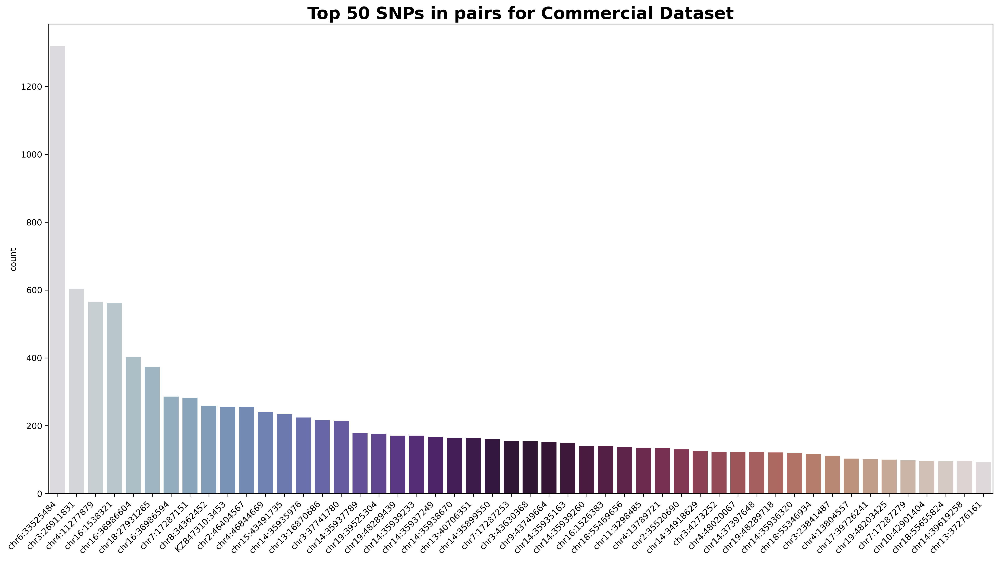

In [8]:
# combining all SNPs from pairs
snps = pd.concat([secret_pairs["SNP1"], secret_pairs["SNP2"]], axis=0)

# visualization of the most abundant SNPs using countplot
fig, ax = plt.subplots(figsize=(20,10), dpi=300)
sns.countplot(x=snps, order=snps.value_counts()[:50].index, palette="twilight", ax=ax)
ax.set_xticklabels(snps.value_counts()[:50].index, rotation=45, ha="right")
ax.set_title("Top 50 SNPs in pairs for Commercial Dataset", fontsize=20, fontweight="bold");

As the result of `MIDESP`for commercial dataset, we obtained **309** SNPs significantly associated with phenotype. Also `MIDESP` returned **18328** SNP pairs (top 0.25% of all possible pairs) with epistatic interactions that associated with Commercial phenotype. For more information *MIDESP-significant* SNPs and pairs, see [the authors article](https://www.mdpi.com/2079-7737/10/9/921).

For the interpretation of the interactions, we mapped the SNPs to their corresponding genes using `bedtools intersect` with respective genome annotation.

### SNP Annotation

#### Intersection with Annotation for genome assembly v2.1

We need to annotate SNP pairs resulted from `MIDESP` tool. We generated `.bed` files to run `bedtools intersect` for intersection with *Glycine max* genome assembly v2.1 [annotation](https://plants.ensembl.org/Glycine_max/Info/Index) `.gff3` file:

**Columns:**

1) **cht** - chromosome or scaffold name same as in annotation `.gff3` file;
2) **mapped_start** - remapped start coordinate;
3) **mapped_stop** - remapped stop coordinate;
4) **SNP_ID** - initial SNP IDs

In [9]:
# path for .bed file
bed_path = "../commercial_dataset/comm_midesp_analysis/secret_SNPs_coordinates"

# generating .bed file for SNP annotation
unique_snps_df = generate_bed_file_unique(dataframe=secret_pairs, bed_path=bed_path)

For mapping SNPs on genome refions, we have run `bedtools intersect` with the following command (annotation file could be found [here](../../annotations/Glycine_max.Glycine_max_v2.1.56.gff3.gz)):

```
bedtools intersect -wao 
                   -a ../commercial_dataset/comm_midesp_analysis/secret_SNPs_coordinates.bed 
                   -b Glycine_max.Glycine_max_v2.1.56.gff3 > 
                   ../commercial_dataset/comm_midesp_analysis/secret_intersection.txt
```

The resulted file contained **21808** regions. Next, we filtered this regions by *type* for remaining only **genes**.

In [10]:
# reading intersection file
# we only interested in columns with "SNP_ID", "chr", "type", "start", "stop", "features", "intersection_length"
secret_inter = pd.read_csv("../commercial_dataset/comm_midesp_analysis/secret_intersection.txt", sep="\t",
                           usecols=[3, 4, 5, 6, 7, 8, 10, 12, 13], header=None,
                           names=["SNP_ID", "chr", "source", "type", "start", "stop", "strand",
                                  "features", "intersection_length"])

# filtering features with type "gene"
secret_inter_genes = secret_inter[secret_inter["type"] == "gene"].reset_index(drop=True)
secret_inter_genes.head()

,SNP_ID,chr,source,type,start,stop,strand,features,intersection_length
0,chr7:17902694,7,ena,gene,17899814,17903389,-,ID=gene:GLYMA_07G148800;biotype=protein_coding...,1
1,chr16:36986452,16,ena,gene,36982310,36991446,+,ID=gene:GLYMA_16G210800;biotype=protein_coding...,1
2,chr4:48020067,4,ena,gene,48017695,48022370,+,ID=gene:GLYMA_04G207700;biotype=protein_coding...,1
3,chr13:37276161,13,ena,gene,37275486,37279668,+,ID=gene:GLYMA_13G270800;biotype=protein_coding...,1
4,chr3:4891054,3,ena,gene,4890564,4894600,+,ID=gene:GLYMA_03G039300;biotype=protein_coding...,1


It is known that the genome annotation may contain more than one entry about a genomic region (for example, some genes may overlap, or a gene may be annotated by different algorithms). Therefore, we checked whether there are duplicates in our case. The "features" column contains a lot of information. The most valuable for our analysis is "gene ID". We parsed "features", dropped duplicated SNP IDs as follows.

In [11]:
# parsing column "features" to obtain gene attibutes (especially gene IDs) and
# combining genes with respective SNPs
secret_features = pd.concat([secret_inter_genes["SNP_ID"], parse_features(secret_inter_genes["features"])], axis=1)

# dropping duplicated "SNP_IDs" 
secret_features = secret_features.drop_duplicates(subset="SNP_ID", keep="first").reset_index(drop=True)

# saving gene features to file for any future purpose
secret_features.to_csv("../commercial_dataset/comm_midesp_analysis/secret_features_for_snps.txt", sep="\t", index=False)

We have **3181 genes** after SNP annotation, gene filtering, and dropping duplicated ones.

### Preparation for building gene-gene interactions network

For building a Graph with gene-gene interactions, we replaced SNP IDs in MIDESP output with SNP pairs by genes. Not all of the SNPs from pairs belong to gene regions. Pairs with such SNPs were dropped. As expected, we obtained 3181 pairs.

In [12]:
# dictionary with SNP IDs and respective genes
snp_gene_dict = dict(zip(secret_features["SNP_ID"], secret_features["gene_id"]))
print(f"Number of SNP-gene pairs: {len(snp_gene_dict)}")

Number of SNP-gene pairs: 3181


In [13]:
# copying initial dataframe with SNP pairs
secret_gene_pairs = secret_pairs[["SNP1", "SNP2", "MI_APC"]]

secret_gene_pairs = assign_gene_for_snp(dataframe=secret_pairs, n_snps=2, snp_gene_dict=snp_gene_dict)

As mentioned in [Whang et al., 2017](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5461529/), to expand the analysis scope from SNPs to genes and enable better interpretation and functional validation in a network framework, we convert the constructed SNP epistasis networks into gene-gene interaction networks. Edge weights of the gene-gene interaction network are computed using the edge weights ($MI_APC$) of SNP epistasis network. As multiple SNPs can be mapped to the same gene, we need an algorithm to determine the weight between two genes given the mapped SNPs and the association strengths between them. Given multiple edge weights between SNPs belonging to two different genes, we used choose **maximum $MI_{APC}$** value as the weight in a gene network.

We checked if there are any mirrored SNP pairs and dropped one of them due to they are equal. For example, $(1, 2) = (2, 1)$. Also, we checked if any genes were paired with themselves.

Also, we visualized $MI_{APC}$ distribution.

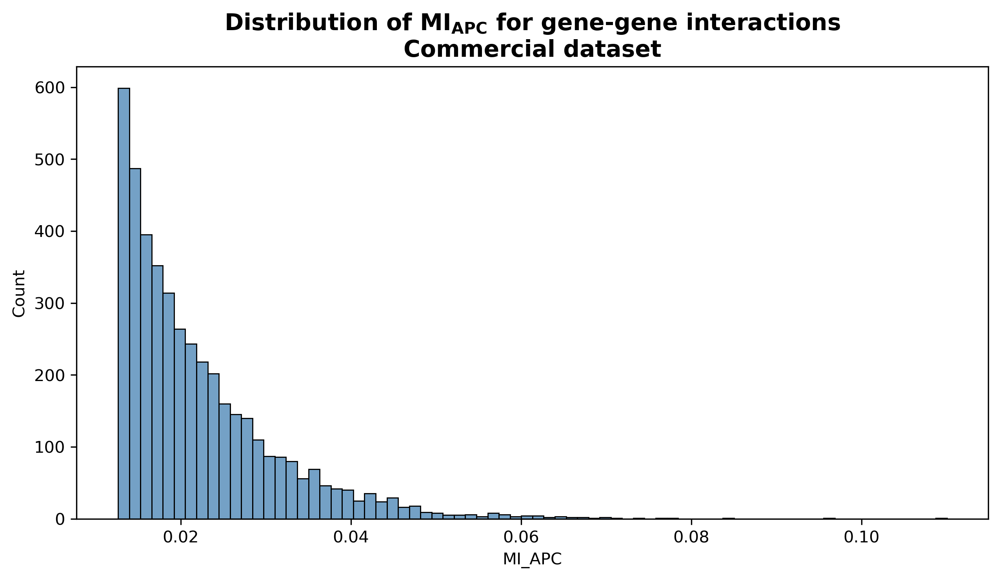

In [14]:
# MI-APC distribution for Commercial dataset
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

sns.histplot(secret_gene_pairs["MI_APC"], ax=ax, color="steelblue")
ax.set_title("Distribution of $\mathbf{MI_{APC}}$ for gene-gene interactions\nCommercial dataset", fontsize=14, fontweight="bold")
plt.savefig("../Pictures/MI_distr_secret.png", format="png", bbox_inches="tight");

### GO and KEGG Enrichment analysis


Further, to perform GO and KEGG enrichment analysis, we converted gene names starts with "GLYMA" to respective Gene IDs using biological DataBase network and its utility for database to database conversions ([db2db](https://biodbnet.abcc.ncifcrf.gov/db/db2db.php)). Some IDs have been supplemented using [NCBI](https://www.ncbi.nlm.nih.gov/gene/) and [SoyBase](https://www.soybase.org/). Then we used [ShinyGO 0.77](http://bioinformatics.sdstate.edu/go/) web tool to perform GO and KEGG annotation for found genes.

In [15]:
# graph with all interacting genes generated form secret_gene_pairs dataframe
G = nx.from_pandas_edgelist(secret_gene_pairs, source="gene1", target="gene2", edge_attr="MI_APC")

with open("../commercial_dataset/comm_midesp_analysis/midesp_secret_all_genes.txt", "w") as file:
    [file.write(str(i)+"\n") for i in G.nodes]

In [16]:
# reading file with gene info
secret_ids = pd.read_csv("../commercial_dataset/comm_midesp_analysis/GLYMA_to_IDs.txt", usecols=[0, 1], sep="\t")

# parsing gene info to obtain Gene IDs for genes starts with "GLYMA"
secret_ids = parse_gene_info(secret_ids, "Gene Info")

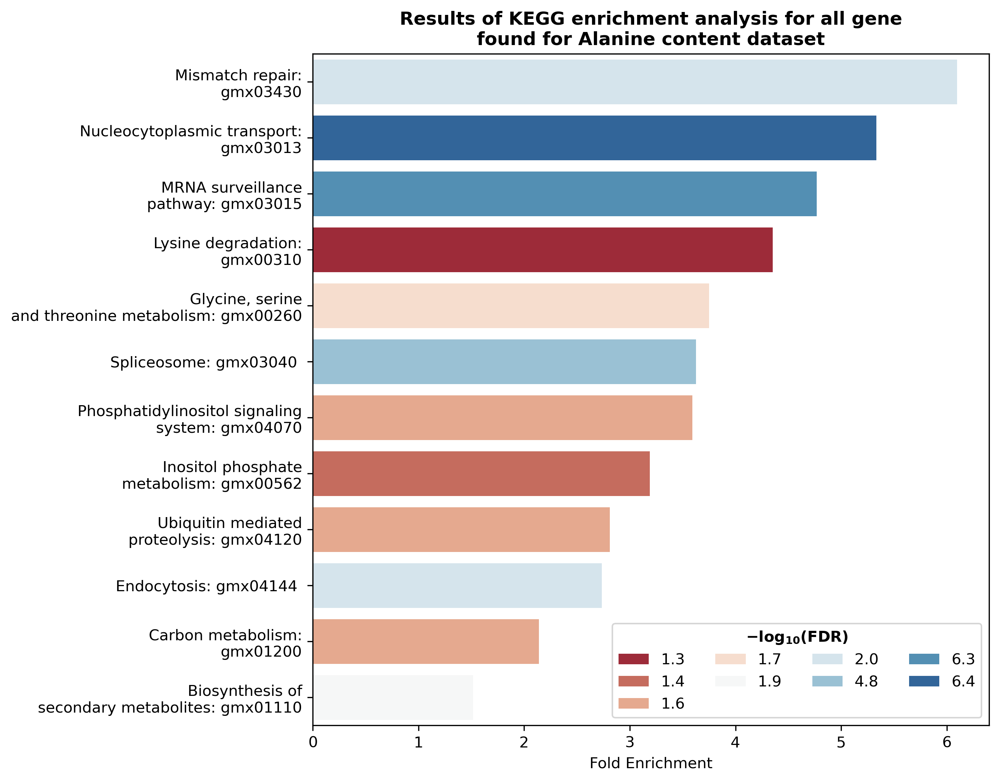

In [17]:
# reading the results for KEGG enrichment analysis
kegg = pd.read_csv("../commercial_dataset/comm_midesp_analysis/secret_enrichment_KEGG.csv")

# parsing file with KEGG enrichment results
kegg = parse_kegg_results(kegg_dataframe=kegg, dataset_name="Alanine content dataset")
plt.savefig("../Pictures/secret_KEGG.png", format="png", bbox_inches="tight");

### Building Graph with gene-gene interactions

Firstly, we have built the Graph with all gene-gene interactions. It takes a while.

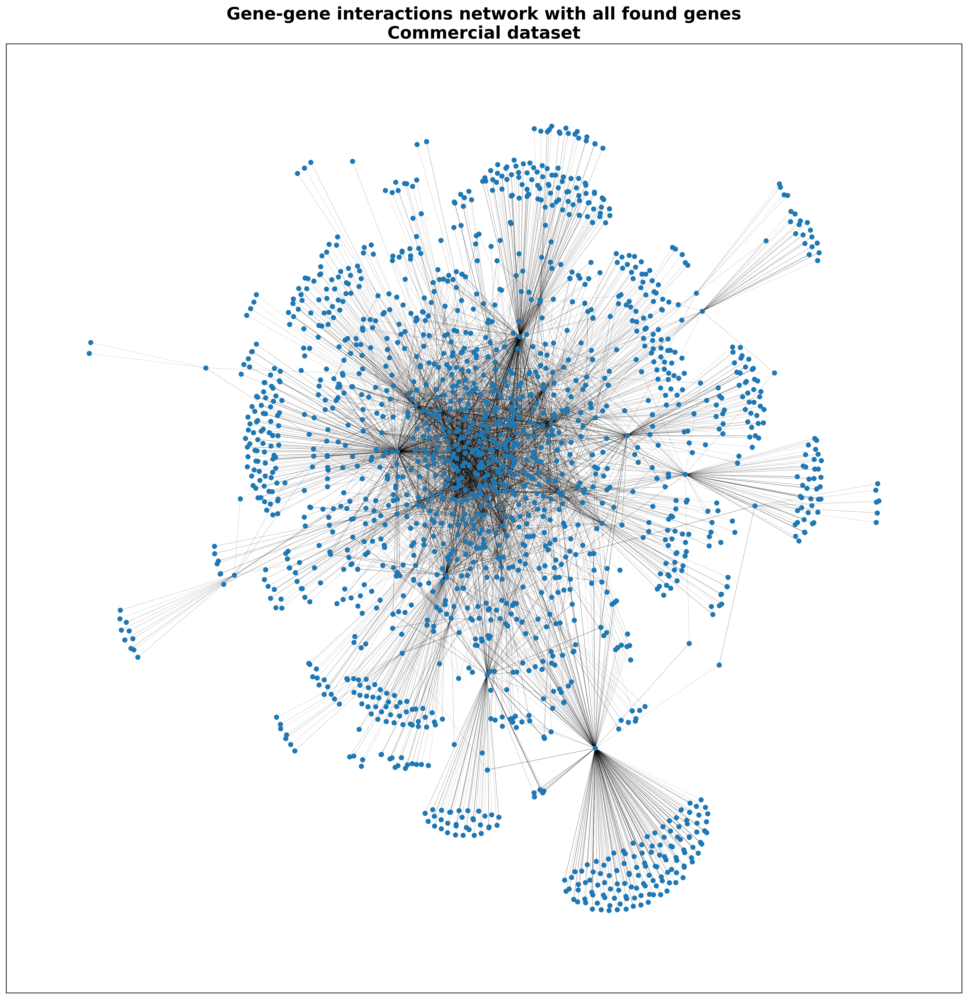

In [18]:
title = "Gene-gene interactions network with all found genes\nCommercial dataset"

# list with MI_APC for edges attributes
mi = [i["MI_APC"]*5 for i in dict(G.edges).values()]

pos = nx.spring_layout
plot_graph(graph=G, title=title, edge_attr=mi, pos=pos, labels=None)
plt.savefig("../Pictures/secret_net_all.png", format="png", bbox_inches="tight");

As recommended by authors, we have prepared subgraph by filtering nodes using **z-normalization** of **node degrees** or the **$MI_{APC}$ $\ge 3$**.

#### 1. Gene-gene interactions graph using **z-normalization** of **node degrees**

We have extracted **node degrees** from the initial graph, normalized them using **z-normalization**, and built subgraph using nodes with $z-scores \ge 3$. Also, we have found top 10 nodes by normalized *degree* in resulted subgraph with the highest degrees and named them by gene names.

In [19]:
# filtering graph by z-score of node degrees
filt_degrees_df, filtered_G = filter_graph_by_degree(graph=G, return_filt_graph=True)

# finding top 10 genes by z-score of node degrees
top_nodes = [i for i in filt_degrees_df["nodes"][:10]]

# writing Gene IDs to file
with open("../commercial_dataset/comm_midesp_analysis/top10_nodes_by_z_degree.txt", "w") as file:
    [file.write(str(i)+"\n") for i in top_nodes]

Then, we manually found names for genes in [NCBI](https://www.ncbi.nlm.nih.gov/gene/) and [SoyBase](https://www.soybase.org/) Databases.

In [20]:
# reading file with top gene names
filt_degrees_df = pd.read_csv("../commercial_dataset/comm_midesp_analysis/top10_nodes_by_z_degree_names.txt", sep=",",
                              names=["nodes", "gene_names"])

# to search NCBI database using genes started with "GLYMA", "v4" postfix should be added to the end of gene name
# here, we repoved postfix to return to genes used as nodes
filt_degrees_df["nodes"] = filt_degrees_df["nodes"].apply(lambda x: str(x)[:-2])

# dictionary with nodes and respective gene names
top_labels_degrees = dict(zip(filt_degrees_df["nodes"], filt_degrees_df["gene_names"]))

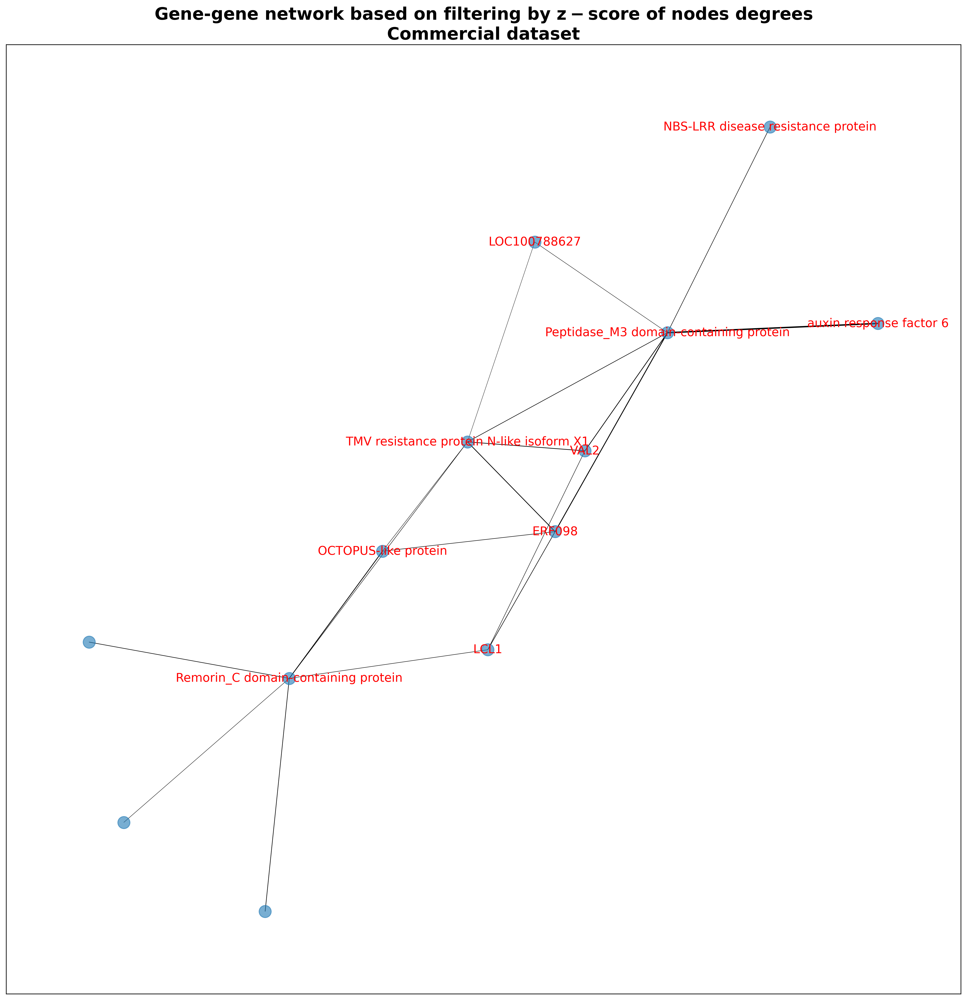

In [21]:
# plotting gene-gene network based on filtering by z-score of nodes degrees
title = "Gene-gene network based on filtering by $\mathbf{z-score}$ of nodes degrees\nCommercial dataset"

# list with MI_APC for edges attributes
mi = [i['MI_APC']*25 for i in dict(filtered_G.edges).values()]
pos = nx.spring_layout
plot_graph(graph=filtered_G, title=title, edge_attr=mi, pos=pos, labels=top_labels_degrees)

#### 2. Gene-gene interactions graph using **z-normalization** of $\mathbf{MI_{APC}}$ between gene pairs

We have normalized $\mathbf{MI_{APC}}$ scores between pairs and built Graph using edges with $z-scores \ge 3$.

In [22]:
# filtering dataframe by z-score MI_APC and finding top 10 gene pairs by these score
filt_MI_df, top_pairs = filter_graph_by_MIAPC(secret_gene_pairs)

In [30]:
# writing SNP and gene pairs for building final network
filt_MI_df.to_csv("../commercial_dataset/comm_midesp_analysis/midesp_secret_nodes_z_MI.csv",
                  columns=["SNP1", "SNP2", "MI_APC", "z_scores", "gene1", "gene2"], index=False)

In [24]:
# writing all SNP and gene pairs to file
secret_gene_pairs.to_csv("../commercial_dataset/comm_midesp_analysis/midesp_secret_snps_genes_pairs.csv",
                         columns=["SNP1", "SNP2", "MI_APC", "z_scores", "gene1", "gene2"], index=False)

Also, we have shown on Graph top 10 pairs by **normalized $\mathbf{MI_{APC}}$**. To search [NCBI](https://www.ncbi.nlm.nih.gov/gene/) database using genes started with "GLYMA", "v4" postfix should be added to the end of gene name.

In [25]:
# adding "v4" postfix to gene names of top 10 pairs
genes_MI = [i+"v4" for i in top_pairs]
with open("../commercial_dataset/comm_midesp_analysis/top10_genes_by_z_MI.txt", "w") as file:
    [file.write(str(i)+"\n") for i in genes_MI]

Then, we manually found names for genes in [NCBI](https://www.ncbi.nlm.nih.gov/gene/) Database.

In [26]:
# reading file with top 10 gene pairs names
top_gene_names = pd.read_csv("../commercial_dataset/comm_midesp_analysis/top10_genes_by_z_MI_names.txt", sep=r",",
                            names=["top_nodes", "names"])
top_gene_names["top_nodes"] = top_gene_names["top_nodes"].apply(lambda x: str(x)[:-2])

# dictionary with nodes and respective gene names
top_labels = dict(zip(top_gene_names["top_nodes"], top_gene_names["names"]))

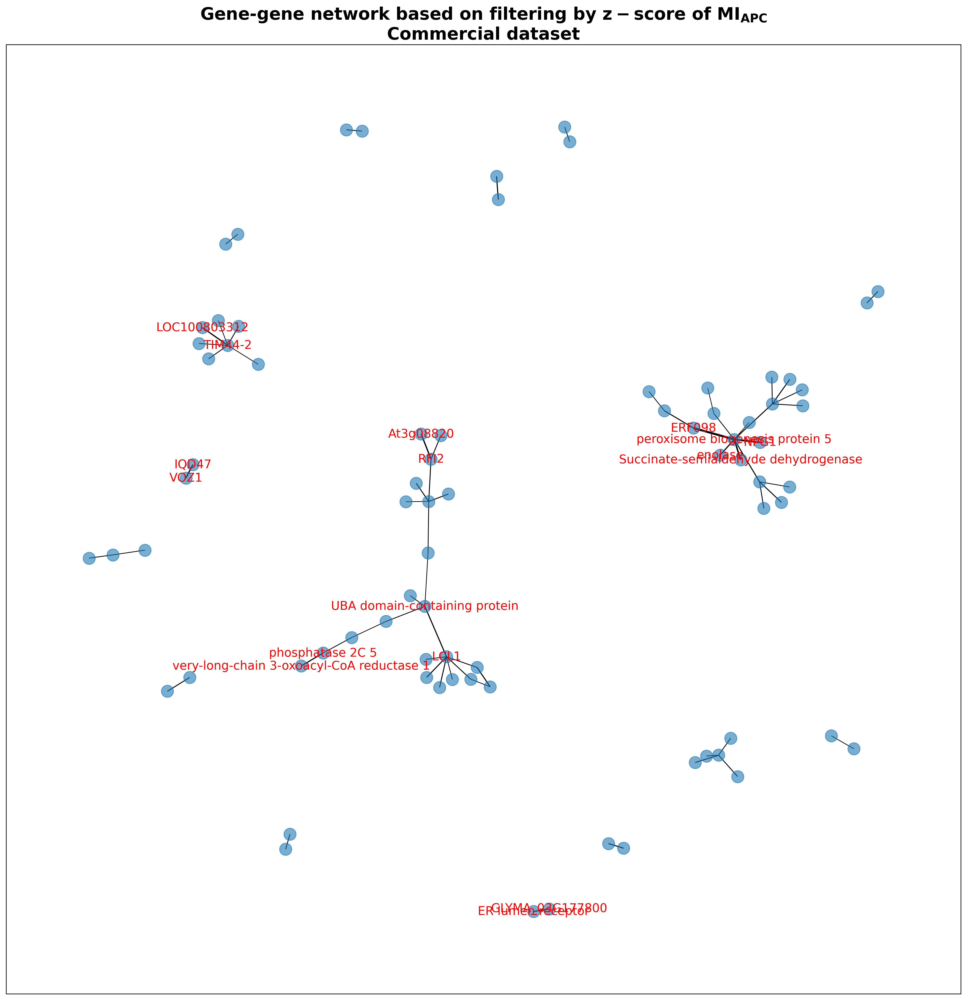

In [27]:
# building gene-gene network based on z-score of MI-APC
MI_G = nx.from_pandas_edgelist(filt_MI_df, source="gene1", target="gene2", edge_attr="z_scores")

# plotting gene-gene network based on filtering by z-score MI_APC
title = "Gene-gene network based on filtering by $\mathbf{z-score}$ of $\mathbf{MI_{APC}}$\nCommercial dataset"

# list with MI_APC for edges attributes
mi = [i['z_scores']/4 for i in dict(MI_G.edges).values()]
pos = nx.spring_layout
plot_graph(graph=MI_G, title=title, edge_attr=mi, pos=pos, labels=top_labels)

### GO IDs of biological processes for genes pairs

We also defined the GO IDs of biological processes for genes using [db2db](https://biodbnet.abcc.ncifcrf.gov/db/db2db.php) to display them on the network. We used them for fancy graph representation.

In [29]:
# reading output with GO IDs for top 10 gene pairs
go_ids = pd.read_csv("../commercial_dataset/comm_midesp_analysis/GO_for_nodes_MI_selected.txt", sep="\t", usecols=[0, 1])

# parsing IDs
go_ids = parse_gene_info(go_ids, "GO - Biological Process")